In [3]:
# library(numbat)
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(stringr)
library(patchwork)
library(glue)
library(ggforce)
library(vcfR)
library(purrr)
library(magrittr)
library(parallel)
library(igraph)
library(ggrepel)
library(ape)
library(tidygraph)
library(ggtree)
library(ggpubr)
library(extraDistr)
library(IRdisplay)
library(ggridges)
library(logger)
options(repr.matrix.max.cols=30, repr.matrix.max.rows=20)
options(repr.vector.max.items = 50)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



   *****       ***   vcfR   ***       *****
   This is vcfR 1.12.0 
     browseVignettes('vcfR') # Documentation
     citation('vcfR') # Citation
   *****       *****      *****       *****



Attaching package: ‘purrr’


The following object is masked from ‘package:data.table’:

    transpose



Attaching package: ‘magrittr’


The following object is masked from ‘package:purrr’:

    set_names



Attaching package: ‘igraph’


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectru

In [4]:
cell_annot = fread('~/paper_data/cell_annotations/cell_annot_MDA.tsv', sep = ',') %>% 
    mutate(annot = copykat.pred) %>% 
    split(.$sample)

count_mat = readRDS('~/paper_data/processed/TNBC4_counts.rds')

In [5]:
cell_annot_washu = fread('~/paper_data/cell_annotations/cell_annot_WASHU_march.tsv') %>%
    split(.$sample)

chrom_sizes = fread('~/ref/hg38.chrom.sizes.txt') %>% 
    setNames(c('CHROM', 'chr_size')) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = factor(CHROM, 1:22)) %>%
    arrange(CHROM)

acen = fread('~/ref/chromosome.band.hg38.txt') %>%
    rename(CHROM = `#chrom`) %>%
    filter(gieStain == 'acen') %>%
    mutate(acen_start = chromStart, acen_end = chromEnd) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = factor(CHROM, 1:22)) %>%
    group_by(CHROM) %>%
    summarise(acen_start = min(acen_start), acen_end = max(acen_end)) %>%
    left_join(chrom_sizes, by = "CHROM")

In [7]:
df = list()

df[['topmed']] = fread(glue('~/paper_data/processed/TNBC4_N_allele_counts.tsv.gz'), sep = '\t')
df[['1000G']] = fread(glue('~/paper_data/processed/TNBC4_1000G_N_allele_counts.tsv.gz'), sep = '\t')

# Define haplotype ground truth

In [21]:
R.utils::sourceDirectory('~/Numbat/R')

cells_tumor = cell_annot[['TNBC4']] %>% filter(annot == 'T') %>% pull(cell)

bulk_tumor = get_bulk(
    count_mat = count_mat[,cells_tumor],
    df = df[['topmed']] %>% filter(cell %in% cells_tumor),
    lambdas_ref = ref_hca,
    gtf = gtf_hg38,
    genetic_map = genetic_map_hg38,
    min_depth = 0
) %>%
analyze_bulk(t = 1e-5, diploid_chroms = c(14, 15), allele_only = TRUE, retest = TRUE, theta_min = 0.49)

Retesting CNVs..



In [573]:
cells_tumor = cell_annot[['TNBC4']] %>% filter(annot == 'T') %>% pull(cell)

In [624]:
R.utils::sourceDirectory('~/Numbat/R')

bulk_tumor_allele = get_allele_bulk(
    df_allele = df[['topmed']] %>% filter(cell %in% cells_tumor),
    genetic_map = genetic_map_hg38,
    min_depth = 0
) 

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”


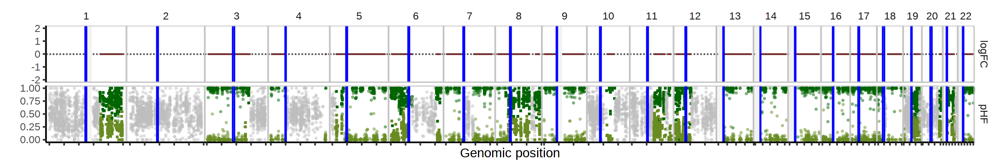

In [24]:
options(repr.plot.width = 12, repr.plot.height = 2, repr.plot.res = 200)

bulk_tumor %>%
plot_psbulk(min_depth = 10, use_pos = TRUE) +
geom_vline(
    data = acen,
    aes(xintercept = acen_start),
    color = 'blue'
) +
geom_vline(
    data = acen,
    aes(xintercept = acen_end),
    color = 'blue'
)

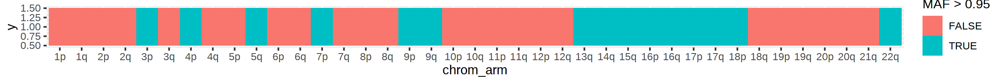

In [693]:
options(repr.plot.width = 12, repr.plot.height = 1, repr.plot.res = 200)

D = bulk_tumor_allele %>% 
    mutate(CHROM = factor(CHROM, 1:22)) %>%
    arrange(CHROM) %>%
    left_join(
        acen %>% select(CHROM, acen_start, acen_end, chr_size),
        by = 'CHROM'
    ) %>%
    mutate(arm = ifelse(POS <= acen_start, 'p', 'q')) %>% 
    filter(!is.na(AD)) %>%
    group_by(CHROM, arm, acen_start, acen_end, chr_size) %>%
    mutate(ppAD = ifelse(AR > 0.5, AD, DP-AD)) %>%
    summarise(
        pAD = sum(ppAD),
        DP = sum(DP),
        MAF = pAD/DP,
        .groups = 'drop'
    ) %>%
    mutate(chrom_arm = paste0(CHROM, arm)) %>%
    mutate(chrom_arm = factor(chrom_arm, unique(chrom_arm)))

D %>%
    ggplot(
        aes(x = chrom_arm, y = 1, fill = MAF > 0.95)
    ) +
    geom_tile()

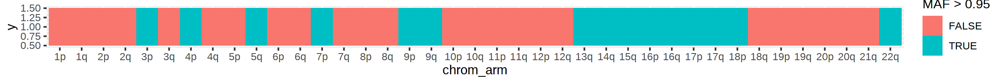

In [139]:
options(repr.plot.width = 12, repr.plot.height = 1, repr.plot.res = 200)

D = bulk_tumor_allele %>% 
    left_join(
        acen %>% select(CHROM, acen_start, acen_end, chr_size),
        by = 'CHROM'
    ) %>%
    mutate(arm = ifelse(POS <= acen_start, 'p', 'q')) %>% 
    filter(!is.na(AD)) %>%
    group_by(CHROM, arm, acen_start, acen_end, chr_size) %>%
    mutate(ppAD = ifelse(AR > 0.5, AD, DP-AD)) %>%
    summarise(
        pAD = sum(ppAD),
        DP = sum(DP),
        MAF = pAD/DP,
        .groups = 'drop'
    ) %>%
    mutate(chrom_arm = paste0(CHROM, arm)) %>%
    mutate(chrom_arm = factor(chrom_arm, unique(chrom_arm)))

D %>%
    ggplot(
        aes(x = chrom_arm, y = 1, fill = MAF > 0.95)
    ) +
    geom_tile()

In [140]:
segs_truth_loh = D %>% filter(MAF > 0.95) %>%
    mutate(
        start = ifelse(str_detect(chrom_arm, 'p'), 0, acen_end),
        end = ifelse(str_detect(chrom_arm, 'p'), acen_start, chr_size)
    ) %>%
    group_by(CHROM) %>%
    summarise(seg_start = min(start), seg_end = max(end)) %>%
    mutate(cnv_state = 'loh') %>%
    mutate(p_loh = 0.5, p_amp = 0, p_del = 0.5, p_bamp = 0, p_bdel = 0)

segs_truth_amp = data.frame(
        CHROM = c(8, 19, 21),
        seg_start = c(47200000, 28100000, 5116341),
        seg_end = c(145138636, 58617616, 46709983),
        cnv_state = 'amp'
    ) %>%
    mutate(p_loh = 0, p_amp = 1, p_del = 0, p_bamp = 0, p_bdel = 0)

segs_truth = rbind(
        segs_truth_loh,
        segs_truth_amp
    ) %>%
    mutate(
        CHROM = factor(CHROM, 1:22),
        seg = 1:n(), 
        seg_cons = seg,
        cnv_state_post = cnv_state
    )

In [125]:
segs_truth %>% fwrite('~/paper_data/phasing_benchmark/segs_truth_TNBC4.tsv', sep = '\t')

In [674]:
segs_consensus = get_segs_consensus(bulk_tumor) %>%
    mutate(
        cnv_state = ifelse(cnv_state == 'loh_1', 'loh', 'neu'),
        cnv_state_post = cnv_state
    )

haplo_truth = bulk_tumor_allele %>%
    annot_consensus(
        segs_truth %>% filter(cnv_state == 'loh')
    ) %>%
    filter(!is.na(AD)) %>%
    mutate(haplo_truth = ifelse(AR < 0.5, 'minor', 'major')) %>%
    select(CHROM, snp_id, haplo_truth, AD, DP, AR)

`summarise()` has grouped output by 'CHROM'. You can override using the `.groups` argument.
Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_text).”


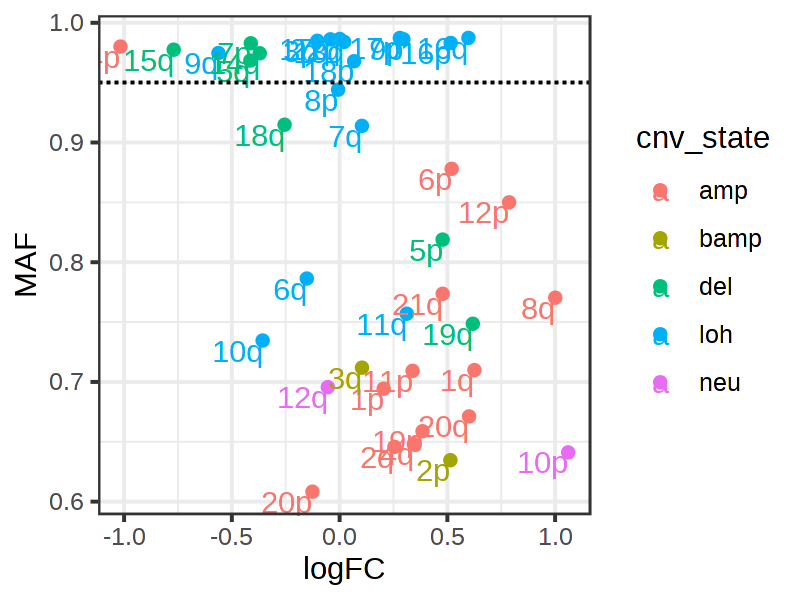

In [1488]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

bulk_tumor_joint %>%
    group_by(CHROM, arm) %>%
    mutate(ppAD = ifelse(AR > 0.5, AD, DP-AD)) %>%
    summarise(
        pAD = sum(ppAD, na.rm = T),
        DP = sum(DP, na.rm = T),
        MAF = pAD/DP,
        Y_obs = sum(Y_obs, na.rm = T),
        logFC = mean(logFC, na.rm = T),
        phi_mle = mean(phi_mle, na.rm = T),
        cnv_state = last(unique(cnv_state_post, na.rm = T))
    ) %>%
    mutate(chrom_arm = paste0(CHROM, arm)) %>%
    mutate(chrom_arm = factor(chrom_arm, unique(chrom_arm))) %>%
    ggplot(
        aes(x = logFC, y = MAF, label = chrom_arm, color = cnv_state)
    ) +
    geom_point() +
    geom_text(hjust = 1, vjust = 1) +
    theme_bw() +
    geom_hline(yintercept = 0.95, linetype = 'dashed')

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



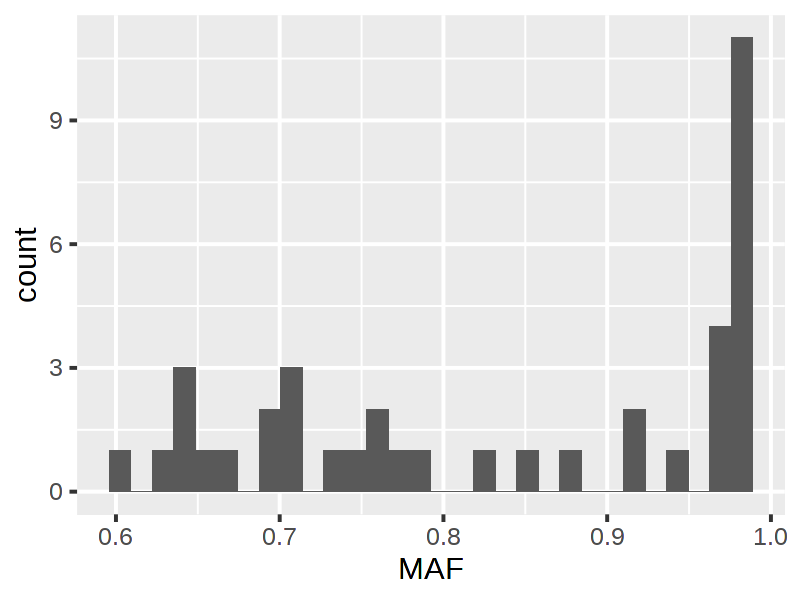

In [1417]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

D %>%
ggplot(
    aes(x = MAF)
) +
geom_histogram() +
geom_vline()

# Phasing statistics

In [642]:
bulk_phased %>% saveRDS('~/paper_data/phasing_benchmark/bulk_phased.rds')

In [639]:
bulk_phased %>% dim

[1] 5580   33

In [634]:
# assign contiguous correctly phased segments
assign_block = function(v) {c(0, cumsum(v[1:length(v)-1] != v[2:length(v)])) + 1}

bulk_phased = bulk_tumor_allele %>% 
    annot_consensus(
        segs_truth %>% filter(cnv_state == 'loh')
    ) %>%
    mutate(BAF = AD/DP) %>%
    filter(!is.na(pAD)) %>%
    filter(!is.na(gene)) %>%
    rowwise() %>%
    mutate(p_binom = binom.test(x = AD, n = DP, p = 0.5)$p.value) %>%
    ungroup() %>%
    mutate(GT_truth = case_when(
        p_binom > 0.05 ~ 'unknown',
        BAF < 0.5 ~ '0|1',
        BAF >= 0.5 ~ '1|0'
    )) %>%
    filter(GT_truth != 'unknown') %>%
    group_by(CHROM) %>%
    mutate(
        config = GT_truth == GT,
        switch = c(0, config[2:length(config)] != config[1:(length(config)-1)]),
        phase_block = assign_block(config),
        phase_block = paste0(CHROM, '_', phase_block),
        p_s = switch_prob_cm(inter_snp_cm)
    ) %>%
    ungroup() 

In [650]:
D = bulk_phased %>% 
    group_by(phase_block, CHROM) %>%
    summarise(
        n_snps = n(),
        length = max(POS) - min(POS),
        n_genes = length(unique(gene)),
        .groups = 'drop'
    ) %>%
    ungroup()

cat('Number of consecutive genes:')
D %>% pull(n_genes) %>% summary
cat('Number of consecutive snps:')
D %>% pull(n_snps) %>% summary

Number of consecutive genes:

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   2.000   3.844   5.000  35.000 

Number of consecutive snps:

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    2.00    6.00   11.62   15.00   90.00 

In [647]:
cat('Within gene phasing accuracy:')
bulk_phased %>%
group_by(CHROM, gene) %>%
filter(n() > 1) %>%
mutate(
    config = GT_truth == GT,
    switch = c(NA, config[2:length(config)] != config[1:(length(config)-1)]),
    inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)])
) %>%
ungroup() %>%
summarise(
    accuracy = 1-mean(na.omit(switch)),
    n = n()
) %>%
signif(3)

cat('Between gene phasing accuracy:')
bulk_phased %>%
group_by(CHROM, gene) %>%
filter(row_number() == 1 | row_number() == n()) %>%
group_by(CHROM) %>%
mutate(
    config = GT_truth == GT,
    switch = c(NA, config[2:length(config)] != config[1:(length(config)-1)]),
    inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)])
) %>%
group_by(CHROM, gene) %>%
filter(row_number() == 1) %>%
ungroup() %>%
summarise(
    accuracy = 1-mean(na.omit(switch)),
    n = n()
) %>%
signif(3)

Within gene phasing accuracy:

accuracy,n
<dbl>,<dbl>
0.968,4860


Between gene phasing accuracy:

accuracy,n
<dbl>,<dbl>
0.798,1720


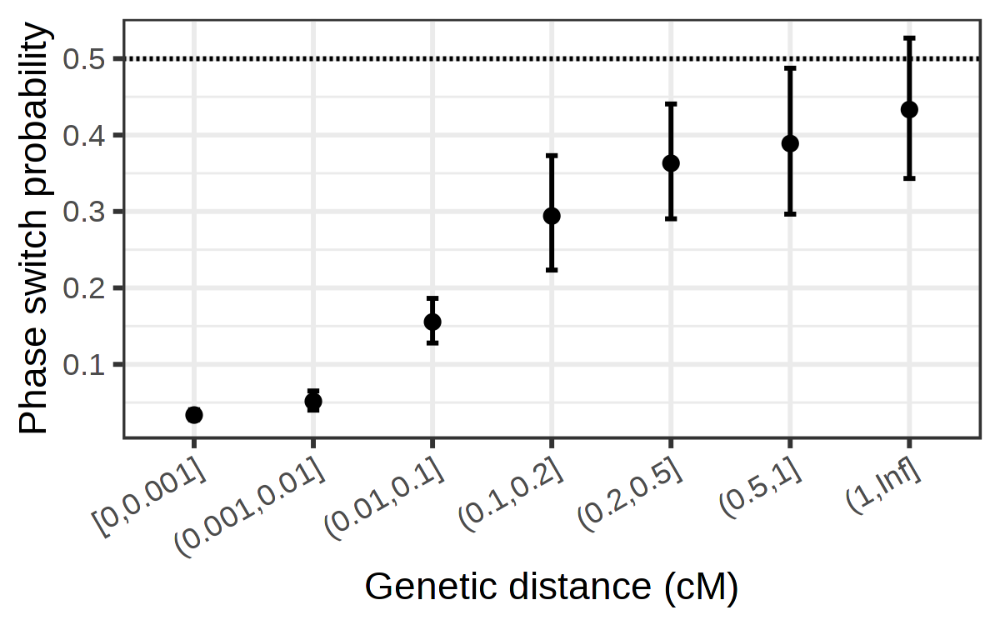

In [637]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 300)

D = bulk_phased %>%
    filter(!is.na(inter_snp_cm)) %>%
    mutate(
        distance_bin = cut(
            inter_snp_cm,
            breaks = c(0, 1e-3, 1e-2, 0.1, 0.2, 0.5, 1, Inf),
            include.lowest = TRUE),
        p_s = switch_prob_cm(inter_snp_cm, lambda = 1)
    )

ggplot(
    D %>% group_by(distance_bin) %>%
    summarise(
        p_s = mean(switch),
        low = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[1],
        high = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[2],
    ),
    aes(x = distance_bin, y = p_s)
) +
geom_errorbar(aes(ymin = low, ymax = high), width = 0.1) +
geom_point() +
geom_hline(yintercept = 0.5, linetype = 'dashed') +
theme_bw() +
guides(color = guide_legend(title = '')) +
scale_color_manual(values = c('gray50', 'blue')) +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) +
xlab('Genetic distance (cM)') +
ylab('Phase switch probability')
# ylim(0,0.5)

# ASE

In [467]:
cells_normal = cell_annot[['TNBC4']] %>% filter(annot == 'N') %>% pull(cell)

bulk_normal = get_bulk(
    count_mat = count_mat[,cells_normal],
    df = df[['topmed']] %>% filter(cell %in% cells_normal),
    lambdas_ref = ref_hca,
    gtf = numbat::gtf_hg38,
    genetic_map = genetic_map_hg38,
    min_depth = 0
) %>%
analyze_bulk()

Retesting CNVs..



Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”


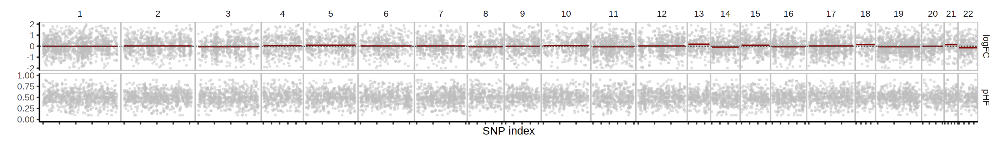

In [468]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk_normal %>% plot_psbulk(min_depth = 10)

In [685]:
cells_normal = cell_annot[['TNBC4']] %>% filter(annot == 'N') %>% pull(cell)

bulk_normal_gamma = mclapply(
    mc.cores = 10,
    c(25, 50, 100, 200, 400),
    function(n) {
        
        lapply(
            1:10,
            function(seed) {
                
                set.seed(seed)
                
                cell_sample = sample(cells_normal, n)

                get_allele_bulk(
                    df_allele = df[['topmed']] %>% filter(cell %in% cell_sample),
                    genetic_map = genetic_map_hg38,
                    min_depth = 0
                ) %>%
                mutate(n_cells = n, seed = seed)
                
            }
        ) %>% 
        bind_rows()
    }
) %>%
bind_rows()

In [686]:
bulk_normal_phased = bulk_normal_gamma %>% 
    inner_join(
        bulk_phased %>% select(snp_id, GT_truth),
        by = 'snp_id'
    ) %>%
    filter(!is.na(gene)) %>%
    mutate(
        MD = ifelse(GT_truth == '0|1', AD, DP - AD),
        PD = DP - MD,
        gene_index = as.integer(factor(gene, unique(gene)))
    )

In [687]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')

D = mclapply(
    mc.cores = 1,
    bulk_normal_phased %>% split(list(.$n_cells, .$seed)),
    function(bulk) {
        lapply(
            0:5,
            function(set_size) {
                                
                if (set_size > 0) {
                    max_index = max(bulk$gene_index)
                    gene_map = setNames(as.integer(cut(1:max_index, seq(0, to = max_index+1, by = set_size))), 1:max_index)
                    
                    bulk %>%
                        mutate(gene_set = gene_map[gene_index]) %>%
                        group_by(gene_set, n_cells, seed) %>%
                        summarise(
                            MD = sum(MD),
                            PD = sum(PD),
                            DP = sum(DP),
                            HF = MD/DP,
                            .groups = 'drop'
                        ) %>%
                        mutate(set_size = set_size)
                } else {
                    bulk %>%
                        select(gene_set = snp_index, n_cells, seed, MD, PD, DP) %>%
                        mutate(HF = MD/DP) %>%
                        mutate(set_size = set_size)
                }
            }
        )  %>%
        bind_rows()
    }
) %>% bind_rows()

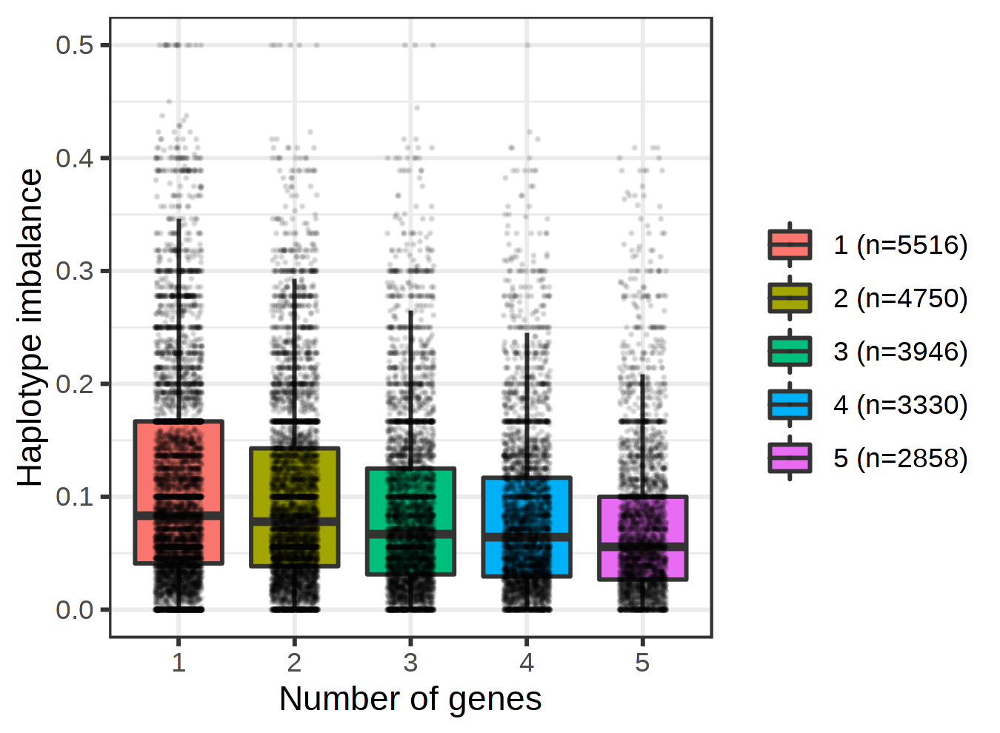

In [690]:
options(repr.plot.width = 4.5, repr.plot.height = 3.3, repr.plot.res = 300)

D %>% 
filter(set_size > 0 & n_cells == 400 & set_size <= 5) %>%
filter(DP > 8) %>%
group_by(set_size) %>%
mutate(set_size = paste0(set_size, ' (n=', n(), ')')) %>%
ungroup() %>%
mutate(set_size = factor(set_size)) %>%
ggplot(
    aes(x = set_size, y = abs(HF-0.5), fill = set_size)
) +
geom_boxplot(outlier.alpha = 0) +
theme_bw() +
geom_jitter(width = 0.2, size = 0.1, alpha = 0.1, color = 'black') +
ylab('Haplotype imbalance')  +
theme(
    strip.background = element_blank(),
#     axis.text.x = element_text(angle = 30, hjust = 1, vjust = 1)
) +
# facet_wrap(~n_cells, scales = 'free') +
# theme(legend.position = 'right') +
guides(fill = guide_legend(title = '')) +
scale_x_discrete(labels=1:5) +
xlab('Number of genes')

In [521]:
bbinom_variance = function(gamma) {
    (gamma/2)^2/(gamma^2*(gamma+1))
}

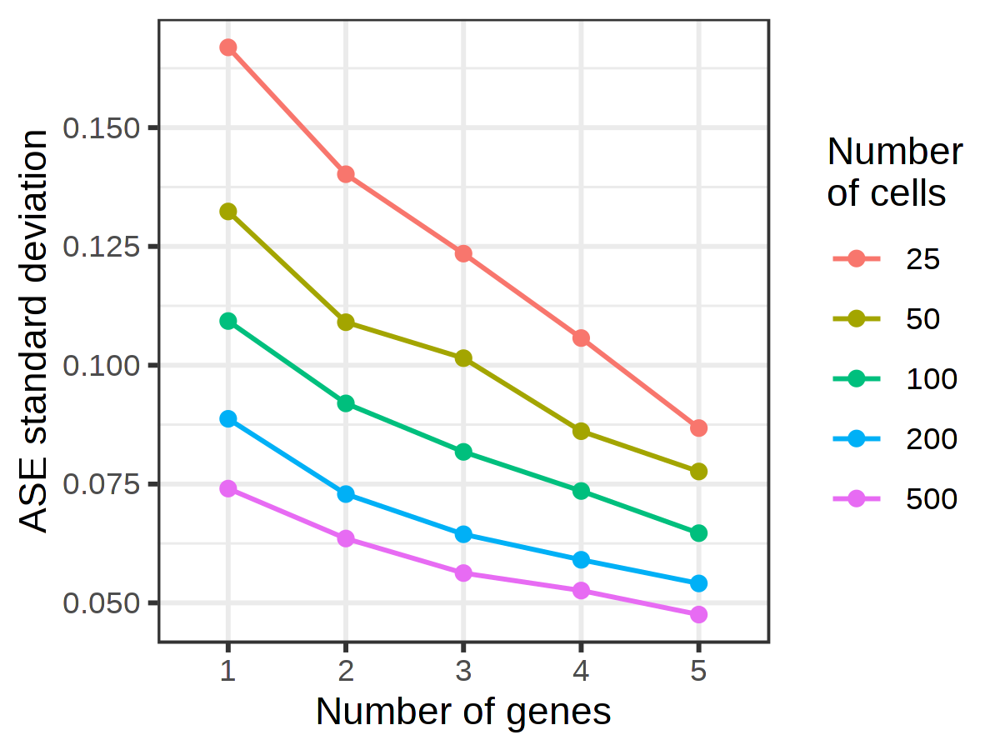

In [683]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')

df_gamma = D %>% 
    filter(set_size <= 5 & set_size > 0) %>%
    group_by(set_size, n_cells) %>% 
    summarise(
        gamma = fit_gamma(MD, DP),
        std = sqrt(bbinom_variance(gamma)),
        .groups = 'drop'
    ) %>%
    mutate(
        n_cells = factor(n_cells),
        set_size = factor(set_size)
    )

p1 = ggplot(
        df_gamma,
        aes(x = set_size, y = std, color = n_cells, group = n_cells)
    ) +
    geom_line() +
    geom_point() +
    theme_bw() +
    ylab('ASE standard deviation') +
    guides(color = guide_legend(title = 'Number\nof cells')) +
    xlab('Number of genes')

# p2 = ggplot(
#         df_gamma,
#         aes(x = set_size, y = gamma, color = n_cells, group = n_cells)
#     ) +
# #     geom_boxplot(aes(group = set_size)) +
#     geom_line() +
#     geom_point() +
#     theme_bw() +
#     ylab('gamma') +
#     guides(color = guide_legend(title = 'Number\nof cells')) +
#     xlab('Number of genes') +
#     ylim(0,NA)
p1

# Serial dilution visualization

In [659]:
plot_serial = function(bulks_serial, haplo_truth) {
    
    pal2 = RColorBrewer::brewer.pal(n = 8, 'Dark2')
    gaps_hg38_filtered = gaps_hg38 %>% filter(end - start > 1e6)

    p = bulks_serial %>% 
        mutate(CHROM = factor(CHROM, 1:22)) %>%
        arrange(-ratio) %>%
        mutate(ratio = factor(ratio, unique(ratio))) %>%
        left_join(
            haplo_truth %>% select(snp_id, CHROM, haplo_truth),
            by = c('snp_id', 'CHROM')
        ) %>%
        mutate(haplo_truth = ifelse(is.na(haplo_truth), 'undetermined', haplo_truth)) %>%
        mutate(haplo_truth = str_to_title(haplo_truth)) %>%
        filter(DP >= 8) %>%
        ggplot(
            aes(x = POS, y = AR, color = haplo_truth),
            na.rm=TRUE
        ) +
        geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray') +
        geom_point(
            alpha = 0.8,
            size = 0.5,
            pch = 16
        ) +
        geom_rect(
            inherit.aes = F,
            data = gaps_hg38_filtered,
            aes(xmin = start, 
                xmax = end,
                ymin = -1,
                ymax = 2),
            fill = 'white'
        ) +
        geom_rect(
            inherit.aes = F,
            data = gaps_hg38_filtered,
            aes(xmin = start, 
                xmax = end,
                ymin = -1,
                ymax = 2),
            fill = 'gray',
            alpha = 0.5
        ) +
        geom_rect(
            inherit.aes = F,
            data = acen,
            aes(xmin = acen_start, 
                xmax = acen_end,
                ymin = -1,
                ymax = 2),
            fill = 'gray',
            alpha = 0.5
        ) +
        theme_classic() +
        theme(
            panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
            panel.spacing.x = unit(0.5, 'mm'),
            strip.background = element_rect(fill = 'gray90', size = 0),
            strip.text = element_text(size = 10),
            legend.position = 'top',
            legend.title = element_text(size=14),
            legend.text = element_text(size=14),
            axis.text.x = element_blank()
        ) +
        scale_shape_manual(values = c(1,4)) +
        scale_size_manual(values = c(1,3)) +
        scale_color_manual(values = c(pal2[1], pal2[2], 'gray')) +
        guides(
            color = guide_legend(
                title = 'True haplotype',
                override.aes = aes(size = 3),
                keywidth = unit(1, 'cm')
            ),
            size = 'none'
        ) +
        ylab('BAF') +
        xlab('Genomic position') +
        scale_x_continuous(expand = expansion(0)) +
        coord_cartesian(ylim = c(0,1)) +
        facet_grid(ratio~CHROM, scale = 'free_x', space = 'free_x')
    
    return(p)
}

## TNBC4

In [144]:
set.seed(0)

nodes = list()

n = 1150
ratios = seq(0, 1, 0.1)
seed = 1
panel = 'topmed'

for (r in ratios) {
    
        set.seed(seed)

        cells_tumor = cell_annot[['TNBC4']] %>% 
            filter(annot == 'T') %>%
            pull(cell) %>% sample(n * r)

        cells_normal = cell_annot[['TNBC4']] %>%
            filter(annot == 'N') %>% 
            pull(cell) %>% sample(n * (1-r))

        nodes[[as.character(r)]] = list(cells = c(cells_tumor, cells_normal), members = seed, label = r, size = n)
    
}

In [145]:
bulks_serial = mclapply(
    nodes,
    mc.cores = 10,
    function(g) {

        bulk = get_allele_bulk(
            df = df[['topmed']] %>% filter(cell %in% g$cells),
            genetic_map = genetic_map_hg38,
            min_depth = 0,
            lambda = 1
        ) %>%
        mutate(
            n_cells = g$size,
            seed = g$members,
            ratio = g$label
        )

})

In [660]:
pal2 = RColorBrewer::brewer.pal(n = 8, 'Dark2')

p_serial = bind_rows(bulks_serial) %>%
    plot_serial(haplo_truth) +
    theme(legend.position = 'bottom')

p_heatmap = segs_truth %>%
    filter(cnv_state == 'loh') %>%
    mutate(sample = 1) %>%
    cnv_heatmap(var = 'sample', label_group = FALSE) +
    theme(
        panel.spacing.x = unit(0.5, 'mm'),
        legend.position = 'none',
        axis.line.x = element_blank(), 
        axis.ticks.x = element_blank(),
        axis.title.x = element_text(),
        plot.margin = margin(0,0,1,0, unit = 'mm')
    ) +
    xlab('Genomic position')

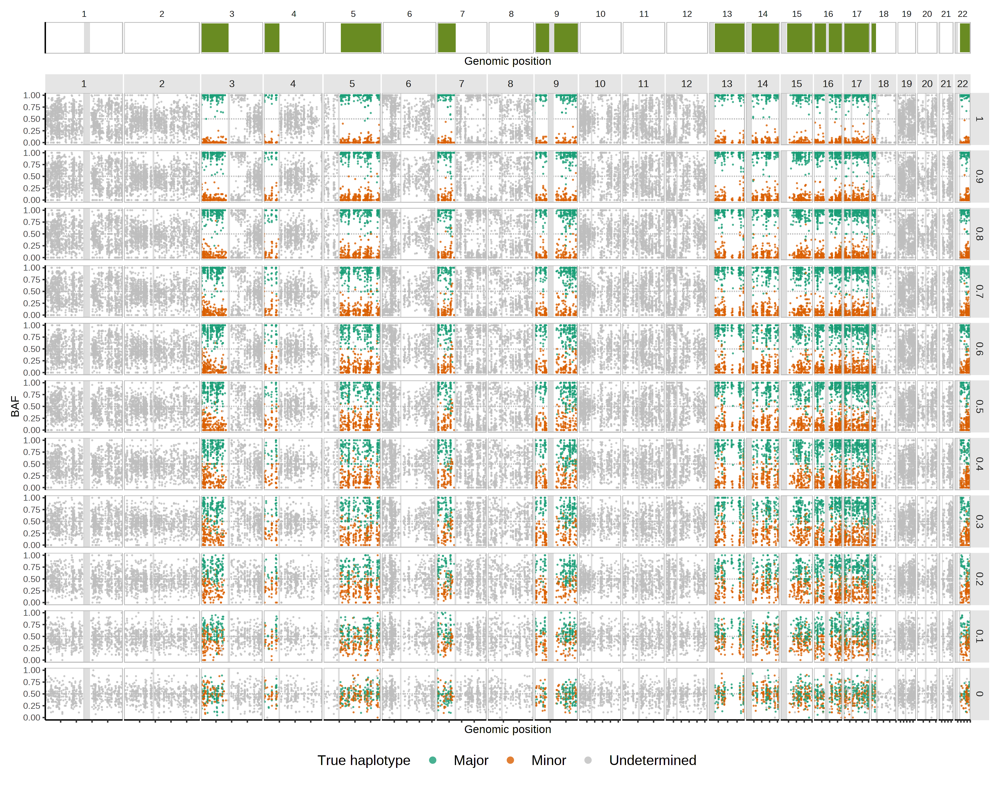

In [661]:
options(repr.plot.width = 14, repr.plot.height = 11, repr.plot.res = 250)

(p_heatmap / p_serial) + plot_layout(heights = c(1,20))

Issue: sometimes alleles are dropped from the pseudobulk because the gene was filtered out? It's why some points are gray in the 100% tumor

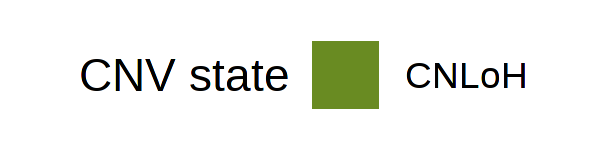

In [531]:
options(repr.plot.width = 2, repr.plot.height = 0.5, repr.plot.res = 300)

(
    p_heatmap + 
        theme(legend.position = 'top') + 
        guides(fill = guide_legend(title = 'CNV state'))
) %>%
ggpubr::get_legend() %>%
ggpubr::as_ggplot()

In [118]:
df_MM = fread(glue('~/paper_data/processed/{sample}_allele_counts.tsv.gz'), nThread = 4)

segs_dna = fread(glue('~/paper_data/purple_out/{sample}/segs_consensus_dna.tsv')) %>% 
    mutate(cnv_state = cnv_state_post) %>%
    mutate(CHROM = factor(CHROM, 1:22))

bulk_tumors = readRDS('~/paper_data/cnv_benchmark/bulk_tumors.rds')

In [666]:
sample = '47491_Primary'
cells_tumor = cell_annot_washu[[sample]] %>% filter(annot == 'T') %>% pull(cell)

bulk_allele_MM = get_allele_bulk(
    df = df_MM %>% filter(cell %in% cells_tumor),
    genetic_map = genetic_map_hg38,
    min_depth = 0,
    lambda = 1
)

In [120]:
set.seed(0)

nodes = list()

n = 500
ratios = seq(0, 1, 0.1)
seed = 1

for (r in ratios) {
    
        set.seed(seed)

        cells_tumor = cell_annot_washu[[sample]] %>% 
            filter(annot == 'T') %>%
            pull(cell) %>% sample(n * r, replace = TRUE)

        cells_normal = cell_annot_washu[[sample]] %>%
            filter(annot == 'N') %>% 
            pull(cell) %>% sample(n * (1-r), replace = TRUE)

        nodes[[as.character(r)]] = list(cells = c(cells_tumor, cells_normal), members = seed, label = r, size = n)
    
}

In [123]:
bulks_serial_MM = mclapply(
    nodes,
    mc.cores = 1,
    function(g) {

        bulk = get_allele_bulk(
            df = df_MM %>% filter(cell %in% g$cells),
            genetic_map = genetic_map_hg38,
            min_depth = 0,
            lambda = 1
        ) %>%
        mutate(
            n_cells = g$size,
            seed = g$members,
            ratio = g$label
        )
})

In [667]:
haplo_truth_MM = bulk_allele_MM %>%
    annot_consensus(
        segs_dna %>% filter(cnv_state_post %in% c('amp', 'loh', 'del')) 
    ) %>%
    filter(!is.na(AD)) %>%
    mutate(haplo_truth = ifelse(AR < 0.5, 'minor', 'major')) %>%
    select(CHROM, snp_id, haplo_truth, AD, DP, AR)

In [669]:
options(repr.plot.width = 12, repr.plot.height = 1, repr.plot.res = 250)
R.utils::sourceDirectory('~/Numbat/R')

p_heatmap = segs_dna %>% 
    filter(cnv_state != 'neu') %>%
    mutate(group = sample) %>% cnv_heatmap(label_group = FALSE) +
    theme(
        panel.spacing.x = unit(0.5, 'mm'),
        legend.position = 'none',
        axis.line.x = element_blank(), 
        axis.ticks.x = element_blank(),
        axis.title.x = element_text(),
        plot.margin = margin(0,0,1,0, unit = 'mm')
    ) +
    xlab('Genomic position')

In [671]:
options(repr.plot.width = 14, repr.plot.height = 11, repr.plot.res = 250)

p_serial = bind_rows(bulks_serial_MM) %>%
    plot_serial(haplo_truth_MM) +
    theme(legend.position = 'bottom')

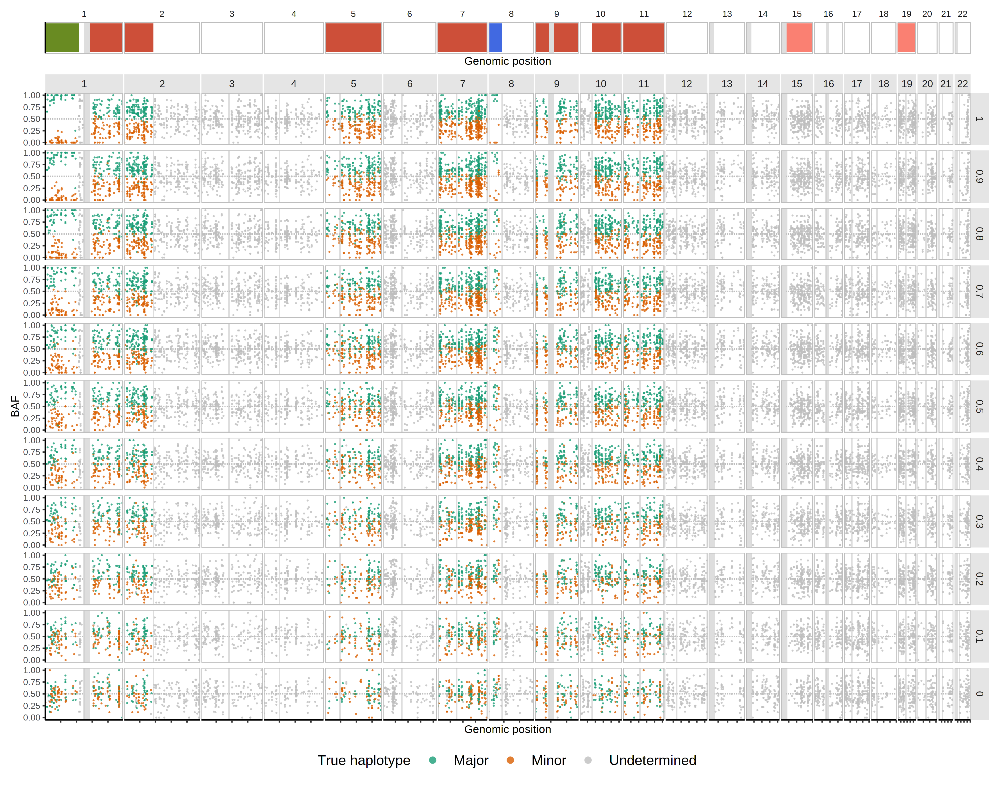

In [672]:
options(repr.plot.width = 14, repr.plot.height = 11, repr.plot.res = 250)

(p_heatmap / p_serial) + plot_layout(heights = c(1,20))

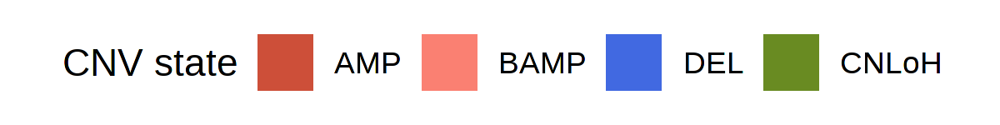

In [670]:
options(repr.plot.width = 4, repr.plot.height = 0.5, repr.plot.res = 300)

(
    p_heatmap + 
        theme(legend.position = 'top') + 
        guides(fill = guide_legend(title = 'CNV state'))
) %>%
ggpubr::get_legend() %>%
ggpubr::as_ggplot()

# SNP coverages

In [363]:
library(rhdf5)

In [446]:
obj = h5read("/home/tenggao/external/WASHU/downsample/47491_Primary_0.5/47491_Primary/outs/molecule_info.h5", name = "barcode_info")

In [447]:
obj %>% str

List of 2
 $ genomes    : chr [1(1d)] "GRCh38"
 $ pass_filter: int [1:3, 1:2154] 7 0 0 19 0 0 817 0 0 907 ...


In [366]:
count_mat = c()

[1] 33538  3056

In [397]:
count_mat[[sample]] %>% length

[1] 1

In [437]:
count_mat = c()
sample = '59114_Relapse_1'
count_mat[[sample]] = list()
for (frac in c('1', '0.5', '0.25')) {
    out_dir = glue('~/external/WASHU/downsample/{sample}_{frac}/{sample}/outs')
    count_mat[[sample]][[frac]] = readMM(glue('{out_dir}/filtered_feature_bc_matrix/matrix.mtx.gz'))
    cells = fread(glue('{out_dir}/filtered_feature_bc_matrix/barcodes.tsv.gz'), header = F)$V1
    genes = fread(glue('{out_dir}/filtered_feature_bc_matrix/features.tsv.gz'), header = F)$V2
    colnames(count_mat[[sample]][[frac]]) = cells
    rownames(count_mat[[sample]][[frac]]) = genes
}

In [438]:
lapply(
    c('1', '0.5', '0.25'),
    function(frac) {
        cells = str_remove(cell_annot_washu[[sample]]$cell, paste0(sample, '_')) %>%
            intersect(colnames(count_mat[[sample]][[frac]]))
        median(colSums(count_mat[[sample]][[frac]][,cells]))
    }
)

[[1]]
[1] 3524

[[2]]
[1] 3235

[[3]]
[1] 2825

In [449]:
fread(glue('~/external/WASHU/downsample/{sample}_{frac}/{sample}/outs/metrics_summary.csv'))

Estimated Number of Cells,Mean Reads per Cell,Median Genes per Cell,Number of Reads,Valid Barcodes,Sequencing Saturation,Q30 Bases in Barcode,Q30 Bases in RNA Read,Q30 Bases in UMI,Reads Mapped to Genome,Reads Mapped Confidently to Genome,Reads Mapped Confidently to Intergenic Regions,Reads Mapped Confidently to Intronic Regions,Reads Mapped Confidently to Exonic Regions,Reads Mapped Confidently to Transcriptome,Reads Mapped Antisense to Gene,Fraction Reads in Cells,Total Genes Detected,Median UMI Counts per Cell
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
"4,187","21,812",913,"91,326,461",98.0%,66.3%,97.6%,77.6%,97.5%,95.1%,92.0%,4.2%,25.2%,62.6%,60.2%,1.2%,87.8%,"21,386","2,575"


In [454]:
samples = c('47491_Primary', '27522_Relapse_2', '59114_Relapse_1', '37692_Primary', '58408_Primary')

lapply(
    samples[1:3],
    function(sample) {
        lapply(
            c(1, 0.5, 0.25),
            function(frac) {
                cov = fread(glue('~/external/WASHU/downsample/{sample}_{frac}/{sample}/outs/metrics_summary.csv')) %>% 
                    pull(`Mean Reads per Cell`) %>%
                    str_remove(',') %>%
                    as.integer
                
                list(cov = cov, sample = sample, frac = frac)
            }
        ) %>% bind_rows()
    }
) %>% 
bind_rows()

cov,sample,frac
<int>,<chr>,<dbl>
163477,47491_Primary,1.00
83330,47491_Primary,0.50
42677,47491_Primary,0.25
50488,27522_Relapse_2,1.00
26970,27522_Relapse_2,0.50
14345,27522_Relapse_2,0.25
82768,59114_Relapse_1,1.00
42303,59114_Relapse_1,0.50
21812,59114_Relapse_1,0.25


In [356]:
sample = 'TNBC4'
lapply(
    c(0.5, 0.25),
    function(frac) {
        cov = fread(glue('~/external/MDA/downsample/{sample}_{frac}/{sample}/outs/metrics_summary.csv')) %>% 
            pull(`Mean Reads per Cell`) %>%
            str_remove(',') %>%
            as.integer

        list(cov = cov, sample = sample, frac = frac)
    }
) %>% bind_rows()

cov,sample,frac
<int>,<chr>,<dbl>
39901,TNBC4,0.50
22620,TNBC4,0.25


# Event calling

In [95]:
sample = '47491_Primary'

In [100]:
snp_coverages_MM = mclapply(
    mc.cores = 5,
    samples,
    function(sample) {
        message(sample)
        lapply(
            c(1, 0.5, 0.25),
            function(coverage) {
                cells = cell_annot_washu[[sample]]$cell
                fread(glue('~/paper_data/processed/{sample}_{coverage}_allele_counts.tsv.gz')) %>%
                    filter(cell %in% cells) %>%
                    filter(GT %in% c('0|1', '1|0')) %>%
                    group_by(cell) %>%
                    summarise(DP = sum(DP)) %>%
                    mutate(sample = sample, coverage = coverage)
        }) %>% bind_rows()
}) %>%
bind_rows()

In [456]:
snp_coverages_TNBC = mclapply(
    mc.cores = 3,
    c(1, 0.5, 0.25),
    function(coverage) {
        cells = cell_annot[['TNBC4']]$cell
        fread(glue('~/paper_data/processed/TNBC4_{coverage}_N_allele_counts.tsv.gz')) %>%
            filter(cell %in% cells) %>%
            filter(GT %in% c('0|1', '1|0')) %>%
            group_by(cell) %>%
            summarise(DP = sum(DP)) %>%
            mutate(coverage = coverage)
}) %>%
bind_rows()

In [457]:
snp_coverages_TNBC %>%
group_by(coverage) %>%
summarise(DP = median(DP))

coverage,DP
<dbl>,<dbl>
0.25,89
0.50,161
1.00,278


In [112]:
snp_coverages_MM %>% group_by(coverage) %>%
summarise(DP = median(DP))

coverage,DP
<dbl>,<dbl>
0.25,123
0.50,176
1.00,244


In [ ]:
for (sample in c(samples, 'TNBC4')) {
    message(sample)
    df[[sample]] = fread(glue('~/paper_data/processed/{sample}_allele_counts.tsv.gz'), nThread = 4)
}

In [826]:
scores_bulk_MM = lapply(
    samples,
    function(sample) {
        lapply(
            c(1, 0.5, 0.25),
            function(coverage) {
                fread(glue('~/paper_data/phasing_benchmark/scores_{sample}_{coverage}.tsv.gz')) %>%
                    mutate(sample = sample, coverage = coverage)
            }
        )
    })%>% bind_rows() %>%
    mutate(sample = factor(sample, samples)) %>%
    mutate(cnv_state = ifelse(cnv_state == 'del', 'loh', cnv_state)) %>%
    group_by(method, ratio, n_cells, l, coverage, cnv_state) %>%
    summarise(
         auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
        .groups = 'drop'
    )

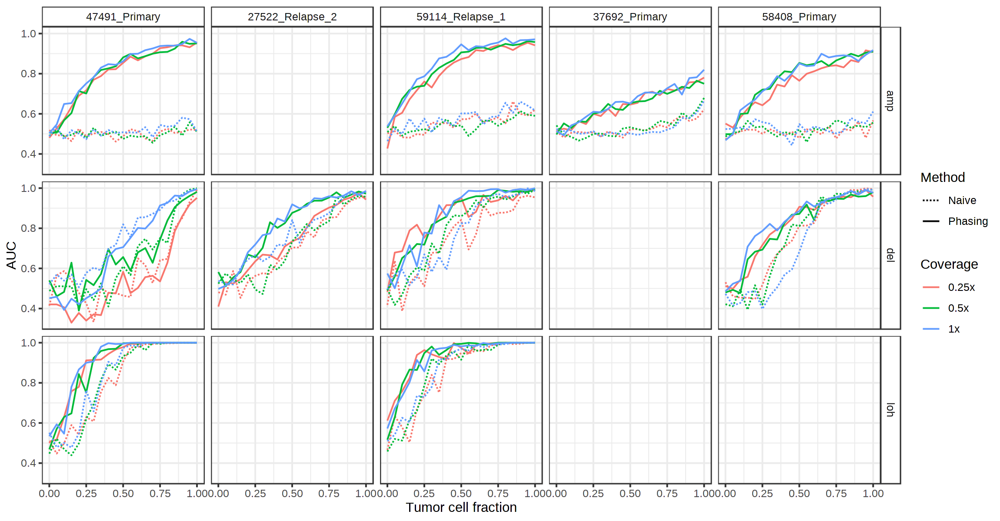

In [688]:
options(repr.plot.width = 11.5, repr.plot.height = 6, repr.plot.res = 200)

scores_downsample %>%
mutate(sample = factor(sample, samples)) %>%
group_by(method, ratio, coverage, l, cnv_state, sample) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
mutate(method = str_to_sentence(method)) %>%
mutate(coverage = paste0(coverage, 'x')) %>%
ggplot(
) + 
facet_grid(cnv_state~sample) +
geom_line(aes(x = ratio, y = auc, color = coverage, linetype = method)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA)
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
guides(
    color = guide_legend('Coverage'),
    linetype = guide_legend('Method')
) +
xlab('Tumor cell fraction') +
ylab('AUC')

In [680]:
sample = '47491_Primary'

In [451]:
cell_scores_downsample = mclapply(
    samples,
    mc.cores = length(samples),
    function(sample) {
        lapply(
            c(0.25, 0.5, 1),
            function(coverage) {
                fread(glue('~/paper_data/phasing_benchmark/cell_scores_{sample}_{coverage}.tsv.gz')) %>%
                    mutate(sample = sample, coverage = coverage)
            }
        )
    })%>% bind_rows()

In [837]:
options(repr.plot.width = 10.5, repr.plot.height = 3, repr.plot.res = 200)

scores_sc_MM = cell_scores_downsample %>%
    inner_join(bind_rows(cell_annot_washu), by = c('cell', 'sample')) %>%
    filter(total >= 3) %>%
    mutate(
        y = as.integer(annot == 'T')
    ) %>%
    mutate(cnv_state = ifelse(cnv_state == 'del', 'loh', cnv_state)) %>%
    group_by(ratio, method, cnv_state, coverage) %>%
    summarise(
        auc = as.numeric(pROC::auc(y, logBF, direction = '<', levels = levels(as.factor(y)))),
        .groups = 'drop'
    )

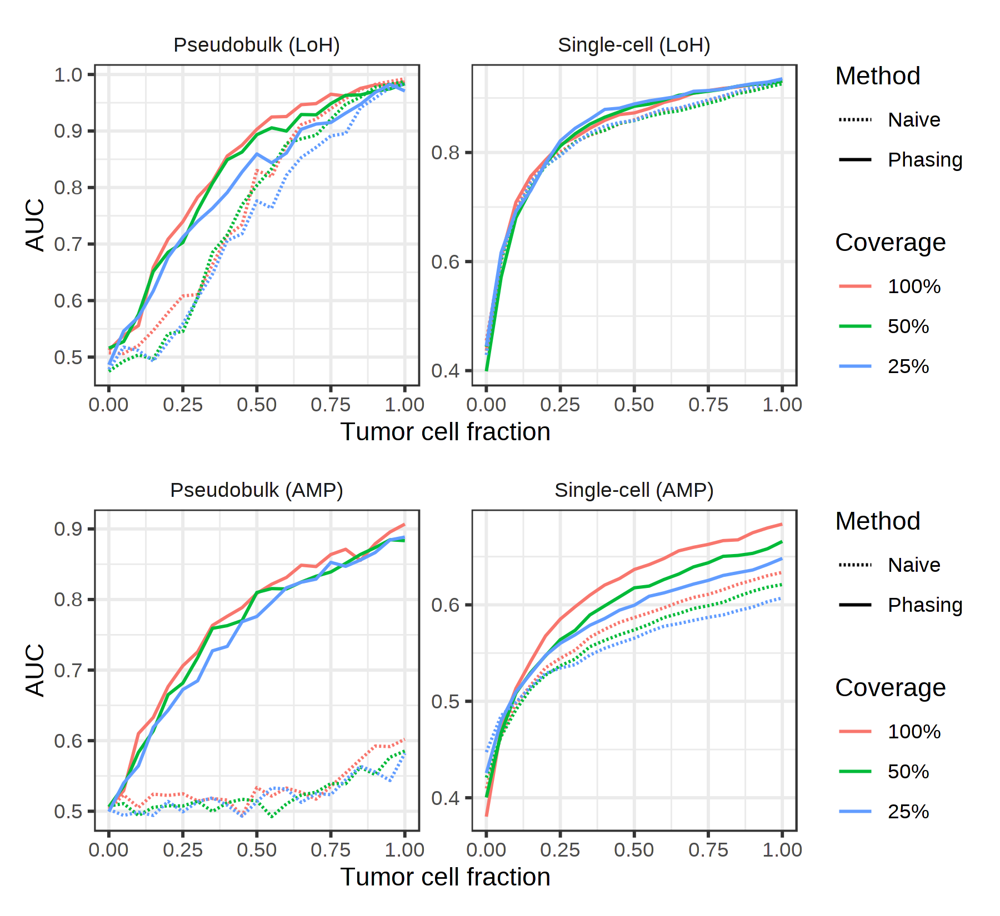

In [884]:
options(repr.plot.width = 6, repr.plot.height = 2.75 * 2, repr.plot.res = 300)

D = bind_rows(
        scores_bulk_MM %>% mutate(task = 'Pseudobulk'),
        scores_sc_MM %>% mutate(task = 'Single-cell')
    )  %>%
    mutate(method = str_to_title(method)) %>%
    mutate(coverage = paste0(coverage * 100, '%')) %>%
    mutate(coverage = factor(coverage, rev(unique(coverage)))) %>%
    mutate(cnv_state = c('amp' = 'AMP', 'loh' = 'LoH')[cnv_state]) %>%
    mutate(cnv_state = factor(cnv_state, c('LoH', 'AMP'))) %>%
    mutate(task = glue('{task} ({cnv_state})'))

p1 = ggplot(
        D %>% filter(cnv_state == 'LoH'),
    ) + 
    geom_line(aes(x = ratio, y = auc, color = coverage, linetype = method)) +
    theme_bw() +
    theme(
        strip.background = element_blank()
    ) +
    scale_linetype_manual(values = c('dashed', 'solid')) +
    guides(
        color = guide_legend('Coverage'),
        linetype = guide_legend('Method')
    ) +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    facet_wrap(~task, scales = 'free')

p2 = ggplot(
        D %>% filter(cnv_state == 'AMP'),
    ) + 
    geom_line(aes(x = ratio, y = auc, color = coverage, linetype = method)) +
    theme_bw() +
    theme(
        strip.background = element_blank()
    ) +
    scale_linetype_manual(values = c('dashed', 'solid')) +
    guides(
        color = guide_legend('Coverage'),
        linetype = guide_legend('Method')
    ) +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    facet_wrap(~task, scales = 'free')

p1 / p2

## TNBC4

In [808]:
scores_bulk_TNBC = rbind(
    fread('~/paper_data/phasing_benchmark/scores_TNBC4.tsv.gz') %>% mutate(coverage = 1),
    fread('~/paper_data/phasing_benchmark/scores_TNBC4_0.5.tsv.gz') %>% mutate(coverage = 0.5),
    fread('~/paper_data/phasing_benchmark/scores_TNBC4_0.25.tsv.gz') %>% mutate(coverage = 0.25)
) %>%
group_by(method, ratio, n_cells, l, coverage, cnv_state) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
)

In [448]:
cell_res_downsample_TNBC = rbind(
    fread('~/paper_data/phasing_benchmark/cell_scores_TNBC4.tsv.gz') %>% mutate(coverage = 1),
    fread('~/paper_data/phasing_benchmark/cell_scores_TNBC4_0.5.tsv.gz') %>% mutate(coverage = 0.5),
    fread('~/paper_data/phasing_benchmark/cell_scores_TNBC4_0.25.tsv.gz') %>% mutate(coverage = 0.25)
)

In [810]:
scores_sc_TNBC = cell_res_downsample_TNBC %>% 
    inner_join(cell_annot[['TNBC4']], by = 'cell') %>%
    filter(total >= 3) %>%
    mutate(
        y = as.integer(annot == 'T')
    ) %>%
    group_by(ratio, method, cnv_state, coverage) %>%
    summarise(
        auc = as.numeric(pROC::auc(y, logBF, direction = '<', levels = levels(as.factor(y)))),
        .groups = 'drop'
    )

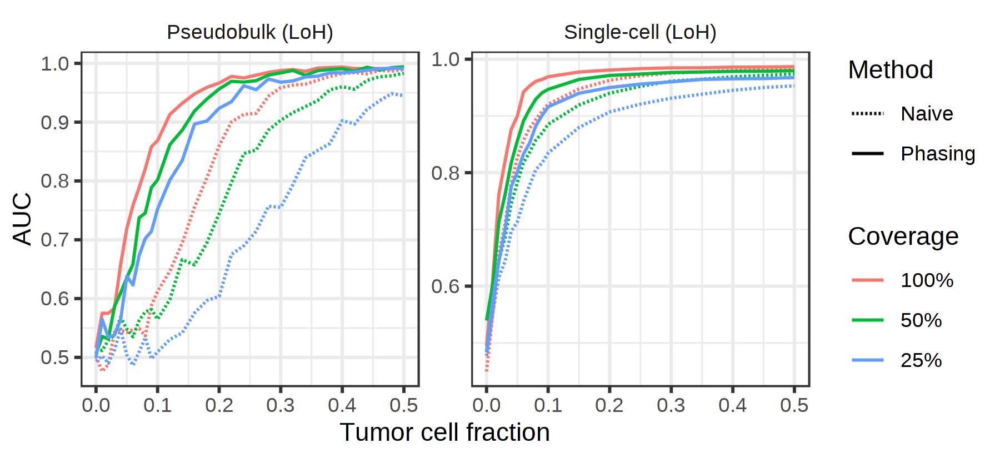

In [875]:
options(repr.plot.width = 6, repr.plot.height = 2.75, repr.plot.res = 300)

bind_rows(
        scores_bulk_TNBC %>% mutate(task = 'Pseudobulk'),
        scores_sc_TNBC %>% mutate(task = 'Single-cell')
    )  %>%
    filter(cnv_state == 'loh') %>%
    mutate(cnv_state = 'LoH') %>%
    mutate(method = str_to_title(method)) %>%
    mutate(task = glue('{task} ({cnv_state})')) %>%
    mutate(coverage = paste0(coverage * 100, '%')) %>%
    mutate(coverage = factor(coverage, rev(unique(coverage)))) %>%
    ggplot(
    ) + 
    geom_line(aes(x = ratio, y = auc, color = coverage, linetype = method)) +
    theme_bw() +
    theme(
        strip.background = element_blank()
    ) +
    scale_linetype_manual(values = c('dashed', 'solid')) +
    guides(
        color = guide_legend('Coverage'),
        linetype = guide_legend('Method')
    ) +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    facet_wrap(~task, scales = 'free')

## Results

In [501]:
scores_TNBC4 = rbind(
    fread('~/paper_data/phasing_benchmark/scores_TNBC4_1000G.tsv.gz') %>% mutate(panel = 'TOPMed'),
    fread('~/paper_data/phasing_benchmark/scores_TNBC4.tsv.gz') %>% mutate(panel = '1000G')
)

In [508]:
scores_TNBC4 %>%
filter(cnv_state == 'loh') %>%
mutate(panel = ifelse(method == 'naive', 'TOPMed', panel)) %>%
group_by(method, panel, ratio) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
filter(panel == 'TOPMed') %>% 
group_by(ratio) %>%
summarise(
    auc_diff = max(auc) - min(auc)
) %>%
arrange(auc_diff) %>%
tail

ratio,auc_diff
<dbl>,<dbl>
0.07,0.2016854
0.14,0.2276375
0.08,0.2287194
0.10,0.2336667
0.12,0.2400632
0.09,0.2438045


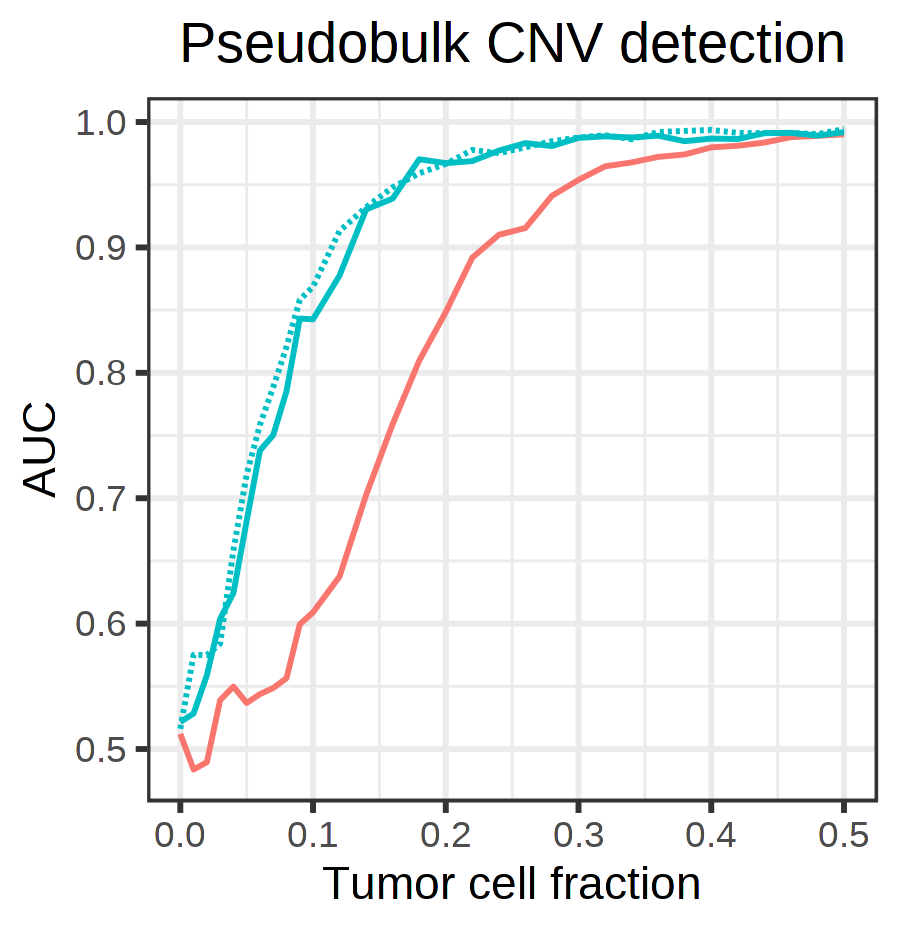

In [733]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)

scores_TNBC4 %>%
filter(cnv_state == 'loh') %>%
mutate(panel = ifelse(method == 'naive', 'TOPMed', panel)) %>%
group_by(method, panel, ratio, l) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA),
    plot.title = element_text(hjust = 0.5),
    legend.position = 'none'
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
xlab('Tumor cell fraction') +
ylab('AUC') +
ggtitle('Pseudobulk CNV detection')

## Illustration

In [192]:
bulks_mixture = fread('~/paper_data/phasing_benchmark/bulks_mixture_TNBC4.tsv.gz')

In [484]:
plot_seg = function(bulks_event, start_random, end_random, chr, ratios, seed, theta_neu, min_depth = 5, use_pos = TRUE) {
        
    gamma = 20
    
    bulk_seg = bulks_event %>%
        filter(seed == UQ(seed)) %>%
        filter(ratio %in% ratios) %>%
        filter(CHROM == chr) %>%
        filter(POS <= end_random & POS >= start_random) %>%
        filter(!is.na(AD)) %>%
        mutate(cnv_state_post = 'loh', seg = 1)
    
    LLRs = bulk_seg %>% 
        group_by(ratio) %>%
        mutate(MAD = ifelse(AD >= DP - AD, AD, DP-AD)) %>%
        summarise(
            approx_theta_post(pAD, DP, p_s, gamma = gamma),
            phasing = calc_allele_LLR(
                pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta_mle, gamma = gamma
            ),
            theta_mle_naive(MAD, DP),
            naive = l_bbinom(MAD, DP, gamma*(0.5+theta_mle), gamma*(0.5-theta_mle)) - 
                l_bbinom(MAD, DP, gamma*(0.5+theta_neu), gamma*(0.5-theta_neu)),
        ) %>%
        reshape2::melt(measure.vars = c('phasing', 'naive'), variable.name = 'method', value.name = 'LLR') %>%
        mutate(variable = ifelse(method == 'phasing', 'pHF', 'BAF'))
    
    bulk_seg = bulk_seg %>% 
        filter(DP >= min_depth) %>%
        split(.$ratio) %>%
        lapply(function(bulk){
        
            bulk %>% 
                mutate(approx_theta_post(pAD, DP, p_s, gamma = gamma)) %>%
                classify_alleles() %>%
                mutate(state = ifelse(p_up > 0.5, 'major', 'minor')) %>%
                annot_haplo_segs() %>%
                ungroup() %>%
                mutate(theta_hat_roll = theta_hat_roll(pAD, DP-pAD, h = 20)) %>%
                group_by(seg) %>%
                mutate(HF = sum(pAD)/sum(DP)) %>%
                ungroup()
        }) %>%
        bind_rows()
    
    
    if (use_pos) {
        marker = 'POS'
    } else {
        marker = 'snp_index'
    }
    
    D = bulk_seg %>% 
        arrange(POS) %>%
        mutate(snp_index = as.integer(factor(snp_index, unique(snp_index)))) %>%
        ungroup() %>%
        filter(DP >= min_depth) %>% 
        rename(pHF = pBAF, BAF = AR) %>%
        reshape2::melt(measure.vars = c('pHF', 'BAF')) %>%
        mutate(state = ifelse(variable == 'BAF' | ratio == 0, 'neu', state)) %>%
        mutate(variable = factor(variable, c('BAF', 'pHF')))

    ggplot(
        D %>% filter(DP >= min_depth),
        aes(x = get(marker), y = value, color = state),
        na.rm=TRUE
    ) +
    geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray50') +
    geom_point(
        size = 1.2,
        alpha = 0.5,
        shape = 16
    ) +
    theme_classic() +
    theme(
        panel.spacing = unit(1, 'mm'),
        panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
#         strip.background = element_blank(),
        strip.background = element_rect(fill = 'gray90', size = 0)
    ) +
    geom_path(
        data = D %>% 
            filter(ratio != 0 & variable == 'pHF'),
        aes(x = get(marker), y = HF, group = seg, color = state),
        lineend = 'round', 
        color = 'darkred', 
        linetype = 'dashed',
        size = 0.3
    ) +
    geom_text(
        data = LLRs,
        inherit.aes = F,
        aes(x = min(D[[marker]]) + 5, y = 0, label = paste0('LLR=', round(LLR, 2))),
        size = 3.5,
        hjust = 0,
        vjust = 0
    ) +
    facet_grid(ratio ~ variable, scale = 'free_x', space = 'free_x') +
    guides(color = "none", fill = 'none', alpha = 'none', shape = 'none') +
    ylim(0,1) +
#     scale_color_manual(values = cnv_colors) +
    scale_x_continuous(expand = expansion(add = 1)) +
    xlab('SNP index') +
    scale_color_manual(
        values = c(cnv_colors[['loh_up']], cnv_colors[['loh_down']], cnv_colors[['neu']])
    )
}

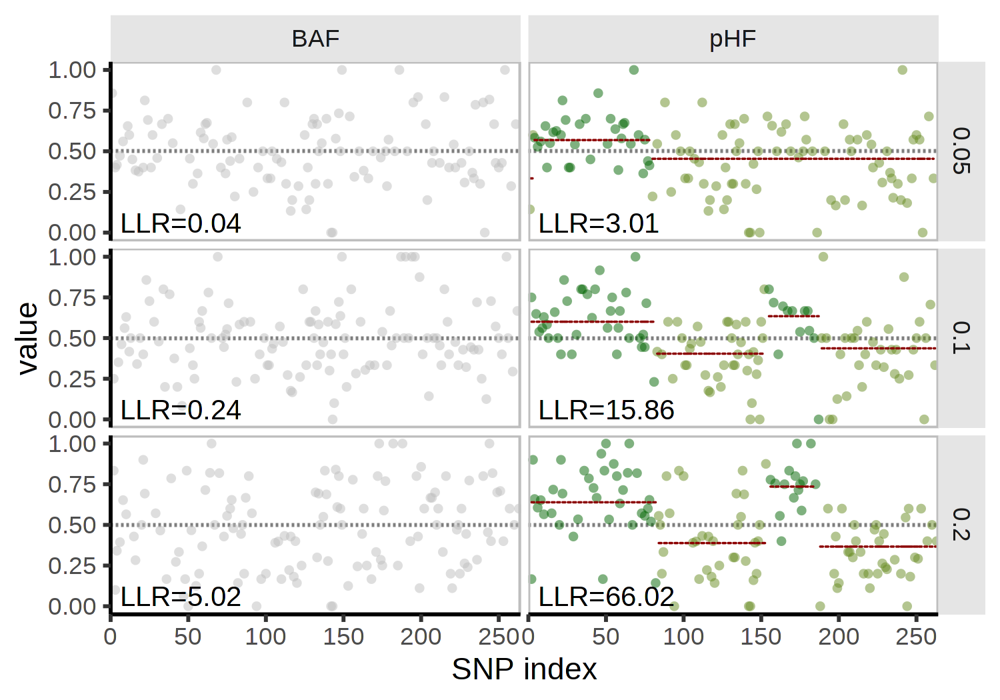

In [485]:
options(repr.plot.width = 5, repr.plot.height = 3.5, repr.plot.res = 300)

plot_seg(
    bulks_mixture,
    start_random = 2e7,
    end_random = 8e7,
    chr = 14,
    ratios = c(0.05, 0.1, 0.2),
    seed = 1,
    theta_neu = 0.23,
    min_depth = 5,
    use_pos = FALSE
)

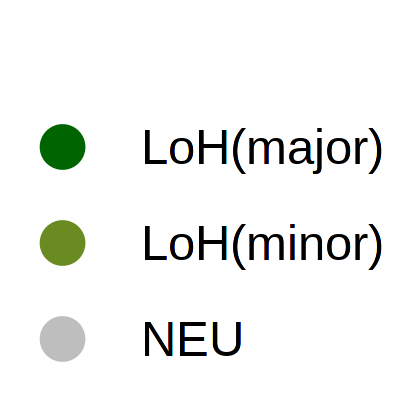

In [1143]:
options(repr.plot.width = 1, repr.plot.height = 1, repr.plot.res = 400)

p = data.frame(
        state = c('LoH(major)', 'LoH(minor)', 'NEU')
    ) %>%
    ggplot(
        aes(x = 1, y = 1, color = state)
    ) +
    geom_point() +
    scale_color_manual(
        values = c(cnv_colors[['loh_up']], cnv_colors[['loh_down']], cnv_colors[['neu']])
    ) +
    guides(color = guide_legend(title = "", override.aes = aes(size = 3))) +
    theme_classic()

as_ggplot(get_legend(p))

# Haplotype reconstruction

## Simulation

In [490]:
set.seed(0)

nodes = list()

n_cells = c(500)
ratios = seq(0, 1, 0.05)

for (n in n_cells) {
    for (r in ratios) {
        for (s in 1:5) {

            set.seed(s)

            cells_tumor = cell_annot[['TNBC4']] %>% 
                filter(annot == 'T') %>%
                pull(cell) %>% sample(n * r)

            cells_normal = cell_annot[['TNBC4']] %>%
                filter(annot == 'N') %>% 
                pull(cell) %>% sample(n * (1-r))

            nodes[[paste0(r, '_', s, '_', n)]] = list(cells = c(cells_tumor, cells_normal), members = s, label = r, size = n)
        }
    }
}

In [491]:
R.utils::sourceDirectory('~/Numbat/R')

panels = c('topmed', '1000G')
bulks_all = list()
lambda = 1

for (panel in panels) {
    bulks_all[[panel]] = mclapply(
        nodes,
        mc.cores = 30,
        function(g) {
                        
            bulk = get_allele_bulk(
                df = df[[panel]] %>% filter(cell %in% g$cells),
                genetic_map = genetic_map_hg38,
                min_depth = 0,
                lambda = lambda
            ) %>%
            mutate(
                n_cells = g$size,
                seed = g$members,
                ratio = g$label
            ) %>%
            annot_consensus(
                segs_truth %>% filter(cnv_state == 'loh')
            ) %>%
            group_by(CHROM, seg) %>%
            mutate(
                approx_theta_post(pAD, DP, p_s, gamma = 20, start = 0.1)
            ) %>%
            classify_alleles() %>%
            mutate(panel = panel)
            
    })
}

## Results

In [489]:
bulks_all = readRDS('~/paper_data/phasing_benchmark/haplotype_bulks_jan.rds')

In [675]:
D = rbind(
        bind_rows(bulks_all[['1000G']]) %>% mutate(panel = '1000G'),
        bind_rows(bulks_all[['topmed']]) %>% mutate(panel = 'topmed')
    ) %>%
    inner_join(
        haplo_truth, by = c("snp_id", "CHROM")
    )

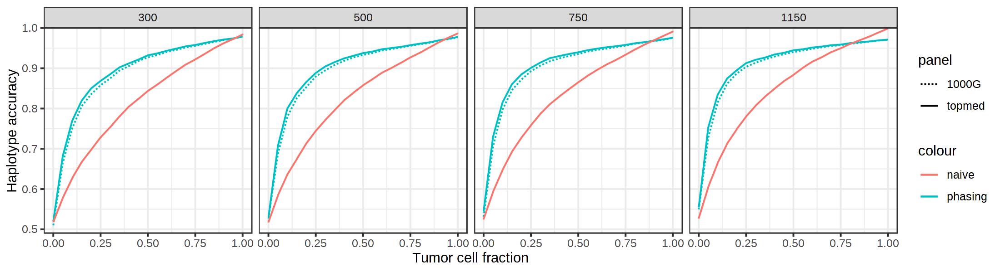

In [148]:
options(repr.plot.width = 11, repr.plot.height = 3, repr.plot.res = 200)

D %>%
group_by(ratio, panel, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-bw_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
ylab('Haplotype accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1)) +
facet_wrap(~n_cells, nrow = 1)

In [678]:
D %>%
group_by(ratio, panel, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
filter(ratio == 0.25) %>%
mutate(
    naive_accuracy = signif(1 - naive_error, 2),
    bw_accuracy = signif(1 - bw_error, 2)
)

ratio,panel,n_cells,naive_error,bw_error,naive_accuracy,bw_accuracy
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.25,1000G,500,0.2559297,0.1253402,0.74,0.87
0.25,topmed,500,0.2559982,0.1130347,0.74,0.89


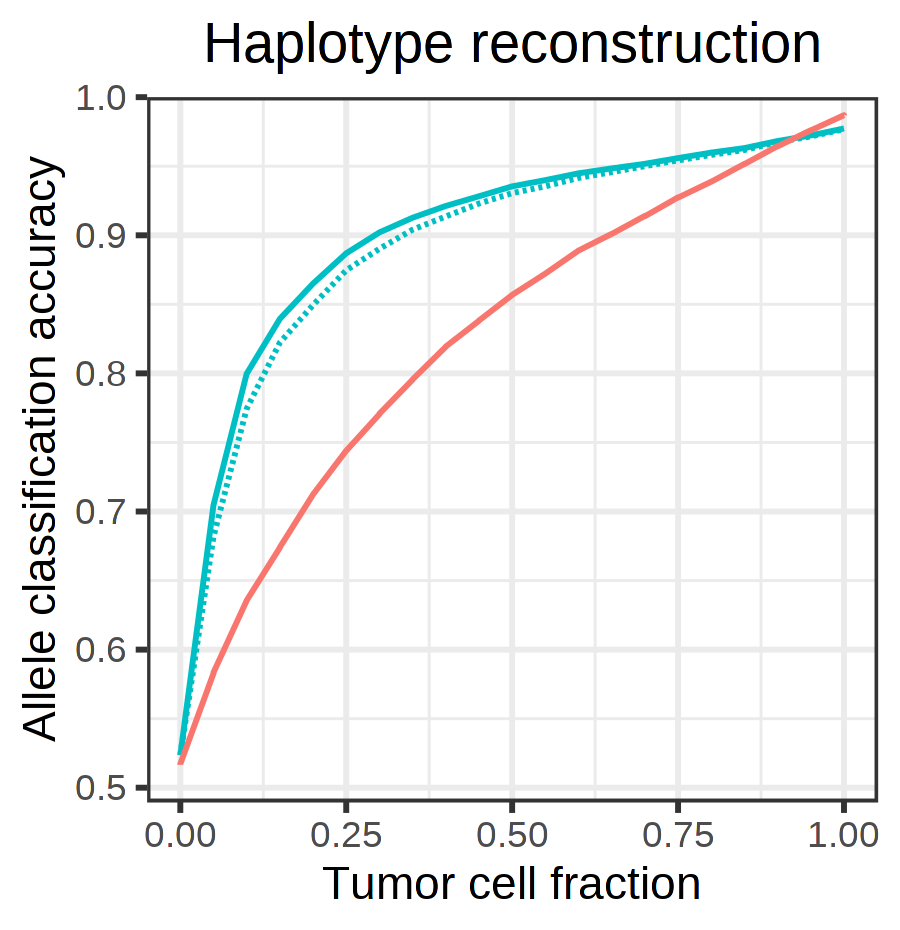

In [677]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)

D %>%
group_by(ratio, panel, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-bw_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
ylab('Allele classification accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1)) +
theme(
    plot.title = element_text(hjust = 0.5),
    legend.position = 'none'
) +
ggtitle('Haplotype reconstruction')

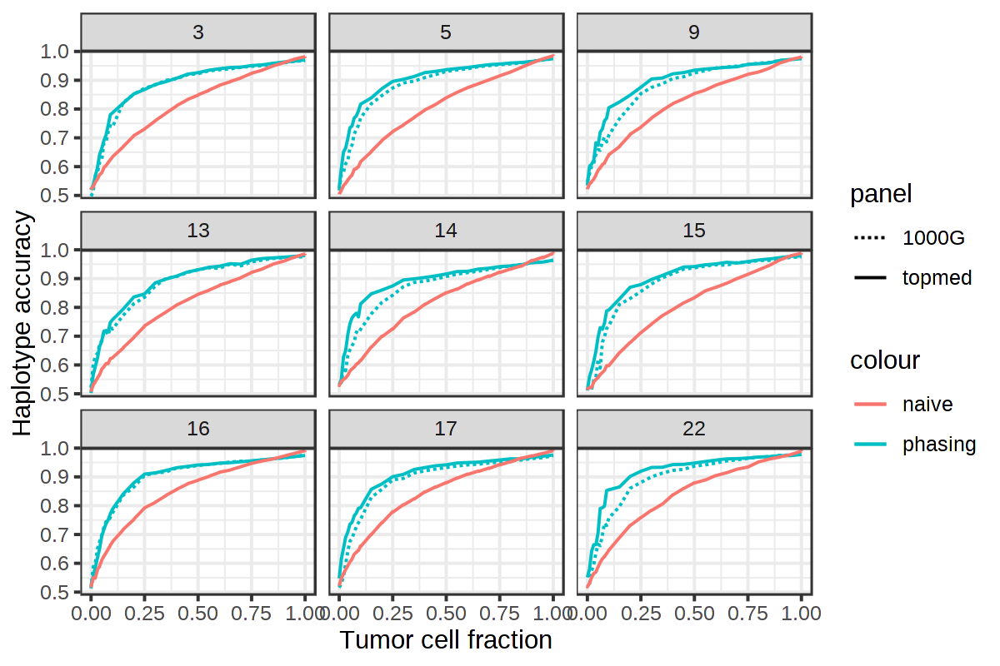

In [1140]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)

D %>%
group_by(ratio, CHROM, panel) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    hmm_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-hmm_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
facet_wrap(~CHROM) +
ylab('Haplotype accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1))

## Illustration

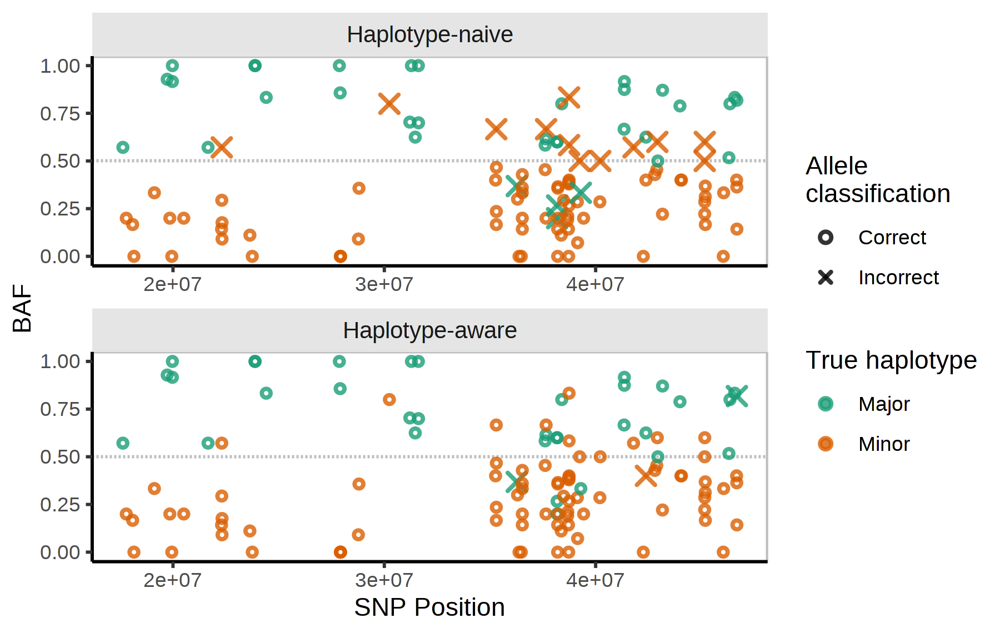

In [492]:
options(repr.plot.width = 6, repr.plot.height = 3.8, repr.plot.res = 300)

pal2 = RColorBrewer::brewer.pal(n = 8, 'Dark2')

D_haplo = bulks_all[['topmed']][['0.2_1_500']] %>%
    annot_consensus(
        segs_truth %>%  filter(cnv_state == 'loh')
    ) %>%
    filter(CHROM == 22 & POS < 4.7e7) %>%
    filter(DP >= 5) %>%
    mutate(snp_index = 1:n()) %>%
    left_join(
        haplo_truth %>% select(snp_id, CHROM, haplo_truth),
        by = c('snp_id', 'CHROM')
    ) %>%
    filter(!is.na(haplo_truth)) %>%
    mutate(phasing = haplo_post == haplo_truth) %>%
    mutate(naive = haplo_naive == haplo_truth) %>%
    reshape2::melt(measure.vars = c('phasing', 'naive'), variable.name = 'method') %>%
    mutate(method = factor(method, c('naive', 'phasing'))) %>%
    mutate(value = ifelse(value, 'Correct', 'Incorrect')) %>%
    mutate(haplo_truth = ifelse(haplo_truth == 'major', 'Major', 'Minor')) %>%
    mutate(CHROM = paste0('chr', CHROM)) %>%
    mutate(var_y = ifelse(method == 'naive', AR, 1-pBAF))

ggplot(
    D_haplo %>% 
        mutate(method = c('naive' = 'Haplotype-naive', 'phasing' = 'Haplotype-aware')[method]) %>%
        mutate(method = factor(method, unique(rev(method)))),
    aes(x = POS, y = AR, pch = value, color = haplo_truth, size = value),
    na.rm=TRUE
) +
geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray') +
geom_point(
    alpha = 0.8,
    stroke = 1
) +
theme_classic() +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 10),
    legend.position = 'right'
) +
facet_wrap(~method, scale = 'free', ncol = 1) +
scale_shape_manual(values = c(1,4)) +
scale_size_manual(values = c(1,3)) +
scale_color_manual(values = c(pal2[1], pal2[2])) +
guides(
    color = guide_legend(title = 'True haplotype'),
    shape = guide_legend(title = 'Allele\nclassification'),
    size = 'none'
) +
ylab('BAF') +
xlab('SNP Position')

# Single-cell CNV evaluation

## Results

In [327]:
cell_res = rbind(
    fread('~/paper_data/phasing_benchmark/cell_scores_TNBC4.tsv.gz') %>% mutate(panel = 'TOPMed'),
    fread('~/paper_data/phasing_benchmark/cell_scores_TNBC4_1000G.tsv.gz') %>% mutate(panel = '1000G')
)

In [735]:
D_sc = cell_res %>% 
    inner_join(cell_annot[['TNBC4']], by = 'cell') %>%
    filter(total >= 3) %>%
    mutate(
        y = as.integer(annot == 'T')
    ) %>%
    group_by(ratio, method, panel, cnv_state) %>%
    summarise(
        auc = as.numeric(pROC::auc(y, logBF, direction = '<', levels = levels(as.factor(y)))),
        .groups = 'drop'
    )

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
“Removed 12 row(s) containing missing values (geom_path).”
Warning message:
“Removed 12 row(s) containing missing values (geom_path).”


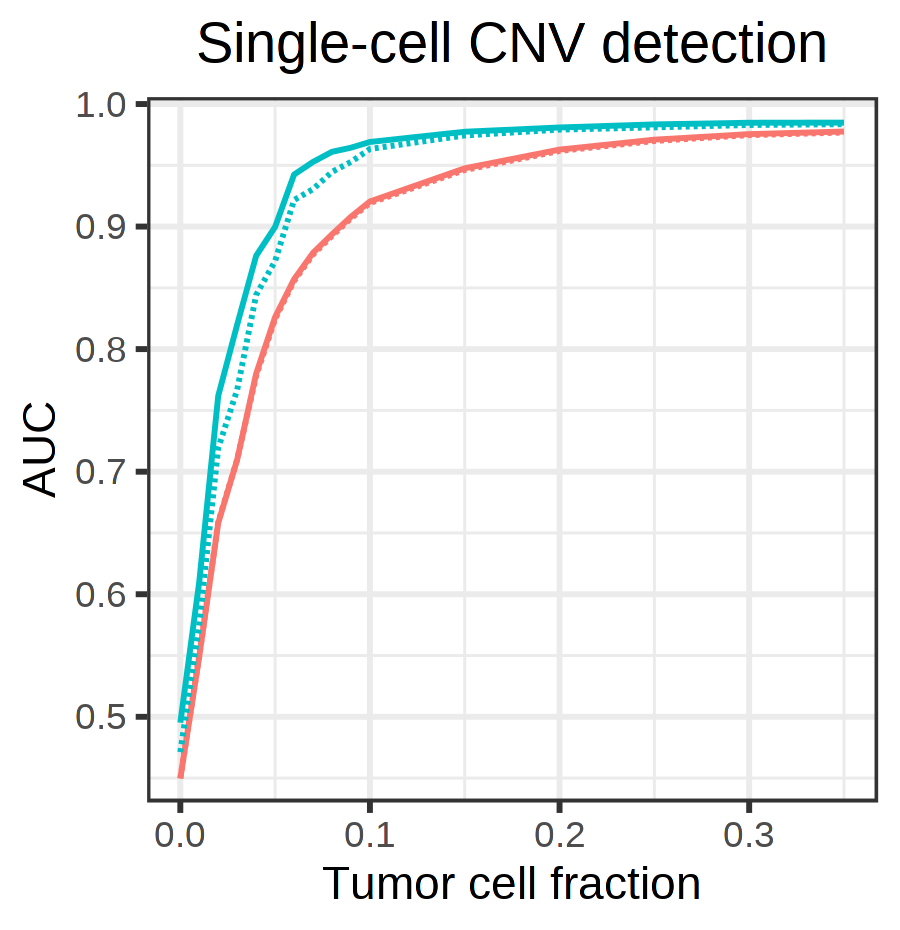

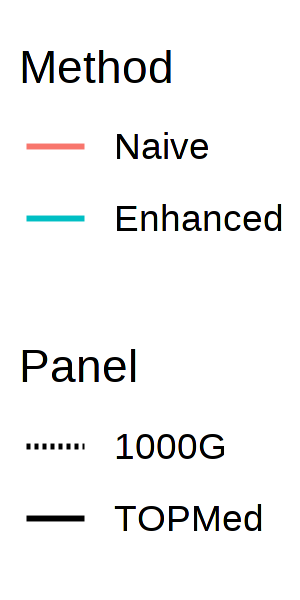

In [737]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)

p = D_sc %>%
    filter(cnv_state == 'loh') %>%
    mutate(method_label = c('naive' = 'Naive', 'phasing' = 'Enhanced')[method]) %>%
    mutate(method_label = factor(method_label, unique(method_label))) %>%
    ggplot(
        aes(x = ratio, y = auc, color = method_label, linetype = panel)
    ) +
    theme_bw() +
    scale_linetype_manual(values = c('dashed', 'solid')) +
    geom_line() +
    xlim(0, 0.35) +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    theme(
        plot.title = element_text(hjust = 0.5)
    ) +
    ggtitle('Single-cell CNV detection') +
    ylim(0.5, 1) +
    scale_y_continuous(expand = expansion(mult = 0.035)) +
    guides(
        color = guide_legend(title = 'Method'),
        linetype = guide_legend(title = 'Panel')
    )

p + theme(legend.position = 'none')

options(repr.plot.width = 1, repr.plot.height = 2, repr.plot.res = 300)

as_ggplot(get_legend(p))

### MM

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



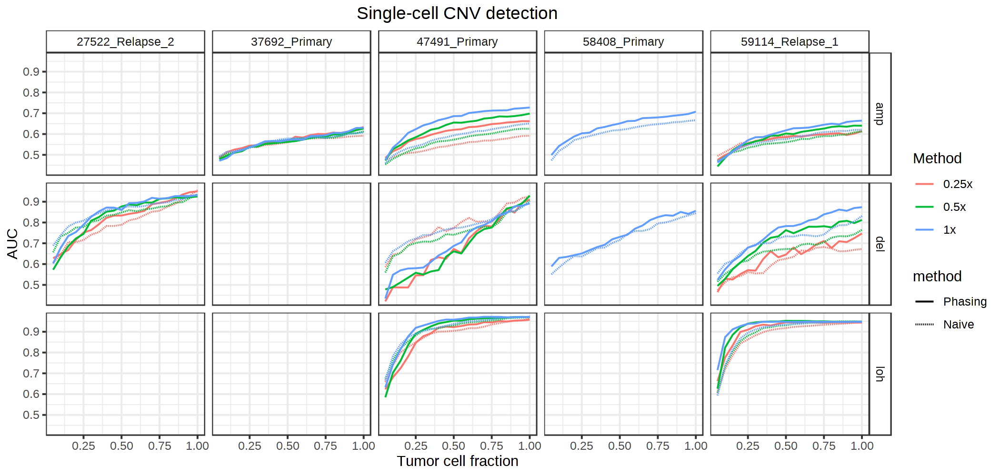

In [368]:
options(repr.plot.width = 10.5, repr.plot.height = 5, repr.plot.res = 200)

D_sc %>%
    mutate(coverage = paste0(coverage, 'x')) %>%
    filter(ratio > 0) %>%
    mutate(method = factor(method, c('Phasing', 'Naive'))) %>%
    ggplot(
        aes(x = ratio, y = auc, color = coverage, linetype = method)
    ) +
    theme_bw() +
    geom_line() +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    theme(
        plot.title = element_text(hjust = 0.5),
        strip.background = element_rect(fill = NA)

    ) +
    facet_grid(cnv_state~sample) +
    ggtitle('Single-cell CNV detection') +
    ylim(0.5, 1) +
    scale_y_continuous(expand = expansion(mult = 0.035)) +
    guides(
        color = guide_legend(title = 'Method'),
    )
#     theme(legend.position = 'none')

## Illustration

In [331]:
con_TNBC = readRDS('~/paper_data/conos_objects/conos_TNBC.rds')

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



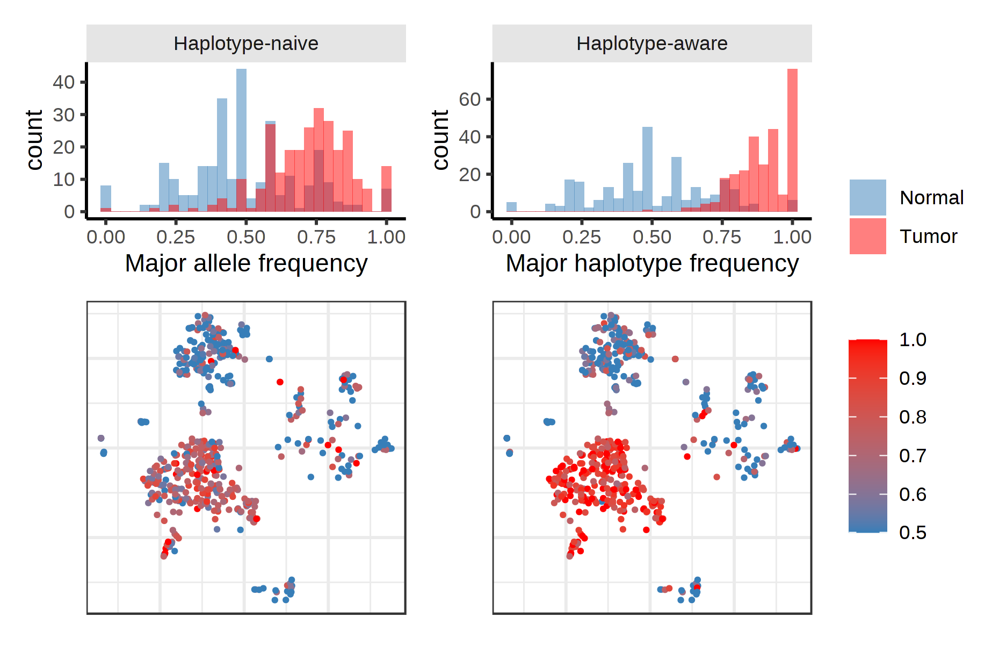

In [493]:
options(repr.plot.width = 6.2, repr.plot.height = 4, repr.plot.res = 300)

D = cell_res %>% filter(panel == 'TOPMed') %>%
    filter(ratio == 0.03 & seed == 1) %>% 
    left_join(cell_annot[['TNBC4']], by = 'cell') %>%
    filter(CHROM == 13) %>%
    filter(total >= 4) %>%
    mutate(annot = c('T' = 'Tumor', 'N' = 'Normal')[annot]) %>%
    mutate(method_label = c('naive' = 'Haplotype-naive', 'phasing' = 'Haplotype-aware')[method]) %>%
    mutate(method_label = factor(method_label, unique(rev(method_label))))

density_naive = D %>% 
    filter(method == 'naive') %>%
    ggplot(
        aes(x = MAF, fill = annot)
    ) +
    geom_histogram(alpha = 0.5, position = position_identity()) +
    theme_classic() +
    facet_wrap(~method_label) +
    guides(fill = 'none') +
    scale_fill_manual(values = c(pal[2], 'red')) +
    xlab('Major allele frequency') +
    theme(
        strip.background = element_rect(fill = 'gray90', size = 0)
    )

density_phasing = D %>% 
    filter(method == 'phasing') %>%
    ggplot(
        aes(x = MAF, fill = annot)
    ) +
    geom_histogram(alpha = 0.5, position = position_identity()) +
    theme_classic() +
    facet_wrap(~method_label) +
    guides(fill = guide_legend(title = '')) +
    scale_fill_manual(values = c(pal[2], 'red')) +
    xlab('Major haplotype frequency') +
    theme(
        strip.background = element_rect(fill = 'gray90', size = 0)
    )

cells_naive = con_TNBC$samples[['TNBC4']]$plotEmbedding(
    size = 0.5,
    alpha = 1,
    colors = D %>% filter(method == 'naive') %>%
        {setNames(.$MAF, .$cell)},
    plot.na = F,
    show.legend = F,
    plot.theme = theme_bw()
) +
scale_color_gradient(low = pal[2], high =  'red', limits = c(0.5, 1), oob = scales::oob_squish) +
guides(color = guide_colorbar(title = 'MAF', barwidth = 0.5, barheight = 4))

cells_phasing = con_TNBC$samples[['TNBC4']]$plotEmbedding(
    size = 0.5,
    alpha = 1,
    colors = D %>% filter(method == 'phasing') %>%
        {setNames(.$MAF, .$cell)},
    plot.na = F,
    show.legend = T,
    plot.theme = theme_bw()
) +
scale_color_gradient(low = pal[2], high =  'red', limits = c(0.5, 1), oob = scales::oob_squish) +
guides(color = guide_colorbar(title = ''))

(
    (density_naive / cells_naive) + plot_layout(heights = c(1,2)) | 
    (density_phasing / cells_phasing) + plot_layout(heights = c(1,2))
) +
plot_layout(guides = 'collect')